In [2]:
# Importar librerías

import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx


from shapely.ops import unary_union


## Información de la base de datos 

1. Citation
GBIF.org (25 May 2025) GBIF Occurrence Download https://doi.org/10.15468/dl.3g5j8x

2. Download Information
DOI: https://doi.org/10.15468/dl.3g5j8x
Creation Date: 23:15:32 25 May 2025
Records included: 8380 records from 173 published datasets
Compressed data size: 506.2 kB
Download format: simple tab-separated values (TSV)

3. Filter used:
    "Country is Colombia",
    "HasCoordinate is true",
    "HasGeospatialIssue is false",
    "TaxonKey is Ochroma pyramidale (Cav.) Urb."
4. Download file retention
Information about this download will always be available at https://doi.org/10.15468/dl.3g5j8x and https://www.gbif.org/occurrence/download/0000818-250525065834625

En este análisis, los registros de GBIF se analizan como eventos que ocurren en ubicaciones particulares pero que podrían ocurrir en un conjunto mucho más amplio de lugares.

In [3]:
# Leer base de datos

data = pd.read_csv(
    r"G:\My Drive\Investigacion2025\Posgrado_Statistics\GeoAnalysis\data\GBIF_data.csv",
    sep="\t",
    encoding="utf-8"
)

In [4]:
# Renombrar columnas para facilitar el manejo
data = data.rename(columns={'decimalLatitude': 'latitude', 
                            'decimalLongitude': 'longitude'})

In [6]:
# Revisar la estructura de los datos
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8380 entries, 0 to 8379
Data columns (total 50 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   gbifID                            8380 non-null   int64  
 1   datasetKey                        8380 non-null   object 
 2   occurrenceID                      8379 non-null   object 
 3   kingdom                           8380 non-null   object 
 4   phylum                            8380 non-null   object 
 5   class                             8380 non-null   object 
 6   order                             8380 non-null   object 
 7   family                            8380 non-null   object 
 8   genus                             8380 non-null   object 
 9   species                           8380 non-null   object 
 10  infraspecificEpithet              2 non-null      object 
 11  taxonRank                         8380 non-null   object 
 12  scient

In [5]:
data['elevation'].describe()

count    1941.000000
mean      824.012457
std       579.538761
min         0.000000
25%       265.000000
50%       679.000000
75%      1448.000000
max      3340.000000
Name: elevation, dtype: float64

In [ ]:
#Pendiente terminar. Usar informacion de elevacion para filtrar datos
#(data['elevation'] > 1500 ).sum()
# Filtrar datos con elevación menor a 1500 metros
#data_menor_elevation = data[data['elevation'] < 1500]

np.int64(111)

In [7]:
# (Opcional) Revisar las primeras filas y columnas disponibles
data.head(2)

,gbifID,datasetKey,occurrenceID,kingdom,phylum,class,order,family,genus,species,...,identifiedBy,dateIdentified,license,rightsHolder,recordedBy,typeStatus,establishmentMeans,lastInterpreted,mediaType,issue
0,4101317302,760e8070-3b44-4533-900e-d83e4a3e0983,UNILLANOS:LLANOS:017:347,Plantae,Tracheophyta,Magnoliopsida,Malvales,Malvaceae,Ochroma,Ochroma pyramidale,...,Andrea Morales Rozo;Luz Stella Suárez;Leidy Gómez,2022-10-04T00:00:00,CC_BY_NC_4_0,NaN,Andrea Morales Rozo;Leidy Gómez,NaN,NaN,2025-02-06T18:04:52.706Z,NaN,COORDINATE_ROUNDED
1,3998769007,14d5676a-2c54-4f94-9023-1e8dcd822aa0,q-10564507852,Plantae,Tracheophyta,Magnoliopsida,Malvales,Malvaceae,Ochroma,Ochroma pyramidale,...,NaN,NaN,CC_BY_4_0,NaN,NaN,NaN,NaN,2025-02-01T01:42:49.911Z,NaN,COORDINATE_ROUNDED;COUNTRY_DERIVED_FROM_COORDI...


Convertimos 'data' a GeoDataFrame y asignamos sistema de coordenadas.

In [5]:
# Convertir tu DataFrame a GeoDataFrame
data_gdf = gpd.GeoDataFrame(
    data, 
    geometry=gpd.points_from_xy(data['longitude'], data['latitude']),
    crs="EPSG:4326"  # WGS84
)

# Reproyectar a Web Mercator (obligatorio para contextily)
#data_gdf = data_gdf.to_crs(epsg=3857)

# Muestra las primeras 5 longitudes y latitudes
print(data_gdf[['longitude', 'latitude']].head())

   longitude  latitude
0 -73.583278  4.075611
1 -75.142062  4.412536
2 -77.116670  4.033330
3 -76.610810  6.266970
4 -73.653020  4.183840


In [8]:
data_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<Axes: >

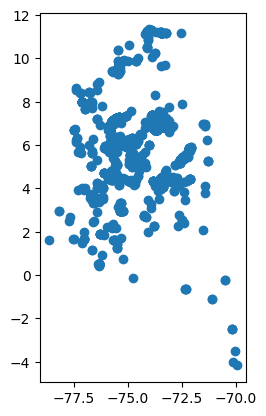

In [11]:
data_gdf.plot()

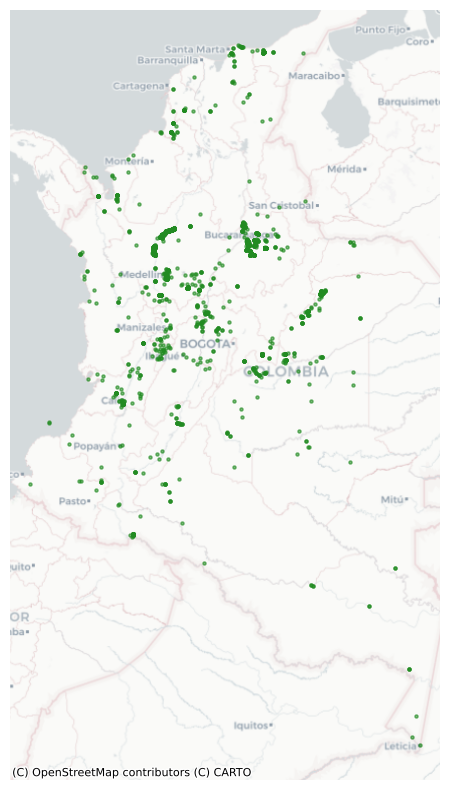

In [12]:
# Crear la figura
fig, ax = plt.subplots(figsize=(10, 10))

# Dibujar puntos
data_gdf.plot(ax=ax, markersize=5, color='forestgreen', alpha=0.6)

# Añadir mapa base
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.CartoDB.Positron)

# Estilo
ax.set_axis_off()  # si prefieres sin ejes

plt.show()

Visualicemos los datos sobre un mapa base de Google Hybrid:
1. Usando folium

In [66]:
import folium

# Centra el mapa en Colombia (ajusta el zoom y centro según tus datos)
m = folium.Map(location=[data['latitude'].mean(), data['longitude'].mean()], zoom_start=6)

# Agrega Google Hybrid como capa base
folium.TileLayer(
    tiles='https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}',
    attr='Google Hybrid',
    name='Google Hybrid',
    overlay=False,
    control=True
).add_to(m)

# Agrega tus puntos
for idx, row in data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=2,
        color='orange',
        fill=True,
        fill_opacity=0.5
    ).add_to(m)

# Muestra el mapa
m

### Departamentos

<Axes: >

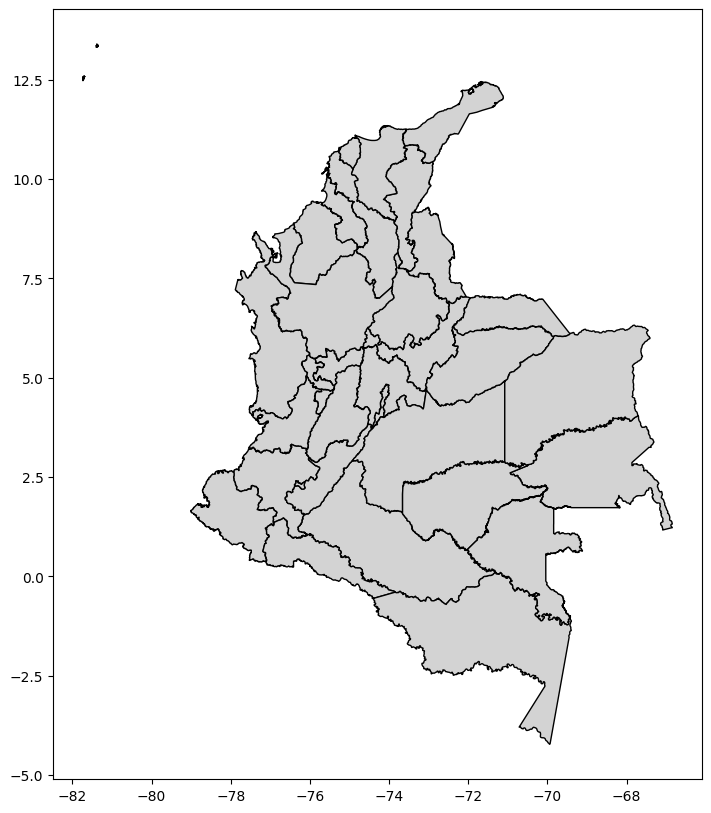

In [6]:
# Usamos departamentos para tener un mejor contexto

# Cargar el shapefile de departamentos de Colombia
departamentos = gpd.read_file(r"G:\My Drive\Investigacion2025\Posgrado_Statistics\GeoAnalysis\data\Departamentos_COL.shp")

departamentos = departamentos.to_crs(epsg=4326)  # Asegurarse de que está en WGS84
# Crear la figura
fig, ax = plt.subplots(figsize=(10, 10))
# Dibujar los departamentos
departamentos.plot(ax=ax, color='lightgrey', edgecolor='black')

In [14]:
departamentos.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Spatial join analysis (GBIF points and Departamentos polygons)

In [15]:
# Guardar el GeoDataFrame con los puntos y departamentos
# Realizar el join espacial
crosswalk_dep = gpd.sjoin(data_gdf, departamentos, how="inner")

# Agregar la columna deseada al DataFrame original
data_gdf["departamento"] = crosswalk_dep["NOMBRE_DPT"]  # Cambia "NOMBRE_DPT" por el nombre de la columna que te interese

In [16]:
data_gdf.head(2)

,gbifID,datasetKey,occurrenceID,kingdom,phylum,class,order,family,genus,species,...,license,rightsHolder,recordedBy,typeStatus,establishmentMeans,lastInterpreted,mediaType,issue,geometry,departamento
0,4101317302,760e8070-3b44-4533-900e-d83e4a3e0983,UNILLANOS:LLANOS:017:347,Plantae,Tracheophyta,Magnoliopsida,Malvales,Malvaceae,Ochroma,Ochroma pyramidale,...,CC_BY_NC_4_0,NaN,Andrea Morales Rozo;Leidy Gómez,NaN,NaN,2025-02-06T18:04:52.706Z,NaN,COORDINATE_ROUNDED,POINT (-73.58328 4.07561),META
1,3998769007,14d5676a-2c54-4f94-9023-1e8dcd822aa0,q-10564507852,Plantae,Tracheophyta,Magnoliopsida,Malvales,Malvaceae,Ochroma,Ochroma pyramidale,...,CC_BY_4_0,NaN,NaN,NaN,NaN,2025-02-01T01:42:49.911Z,NaN,COORDINATE_ROUNDED;COUNTRY_DERIVED_FROM_COORDI...,POINT (-75.14206 4.41254),TOLIMA


# Visualización

Gráfico de dispersión de los puntos geográficos (longitud vs latitud) y los histogramas de cada variable. Útil para ver la distribución espacial de tus datos.

In [18]:
# Proveedores disponibles en contextily
print(ctx.providers.keys())

dict_keys(['OpenStreetMap', 'MapTilesAPI', 'OpenSeaMap', 'OPNVKarte', 'OpenTopoMap', 'OpenRailwayMap', 'OpenFireMap', 'SafeCast', 'Stadia', 'Thunderforest', 'BaseMapDE', 'CyclOSM', 'Jawg', 'MapBox', 'MapTiler', 'TomTom', 'Esri', 'OpenWeatherMap', 'HERE', 'HEREv3', 'FreeMapSK', 'MtbMap', 'CartoDB', 'HikeBike', 'BasemapAT', 'nlmaps', 'NASAGIBS', 'NLS', 'JusticeMap', 'GeoportailFrance', 'OneMapSG', 'USGS', 'WaymarkedTrails', 'OpenAIP', 'OpenSnowMap', 'AzureMaps', 'SwissFederalGeoportal', 'TopPlusOpen', 'Gaode', 'Strava', 'OrdnanceSurvey', 'UN'])


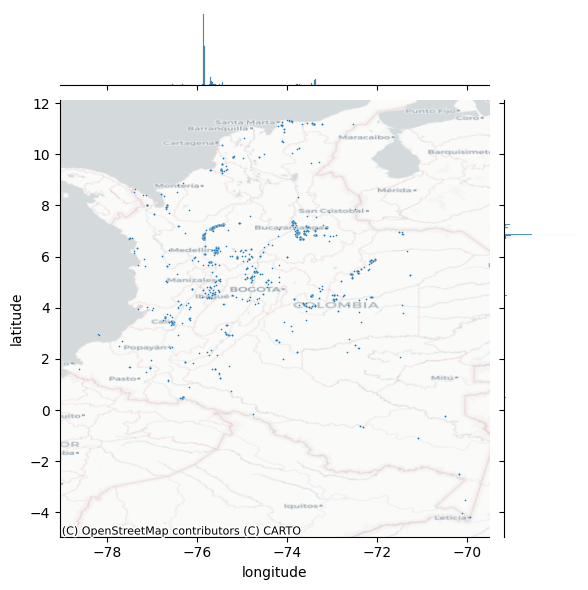

In [ ]:
# Generate scatter plot
import seaborn as sbn
joint_axes = sbn.jointplot(x='longitude', y='latitude', data=data_gdf, s=1.5)
# Add dark basemap
ctx.add_basemap(joint_axes.ax_joint, crs="EPSG:4326", source=ctx.providers.CartoDB.Positron)

2. Histograma de latitud y longitud

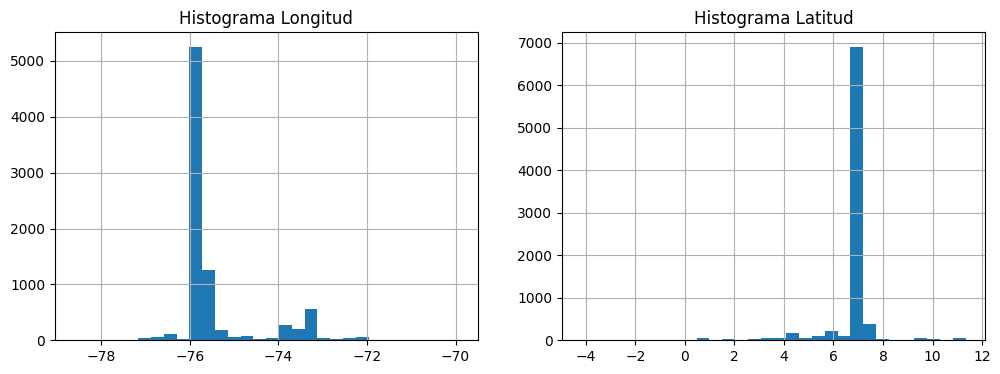

In [20]:
import matplotlib.pyplot as plt
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
data_gdf['longitude'].hist(ax=axes[0], bins=30)
axes[0].set_title('Histograma Longitud')
data_gdf['latitude'].hist(ax=axes[1], bins=30)
axes[1].set_title('Histograma Latitud')
plt.show()

### Puntos en polígonos preestablecidos

1. Irregular lattices. 

In [ ]:
gdf = gpd.read_file(r"G:\My Drive\Investigacion2025\Posgrado_Statistics\GeoAnalysis\data\Balso_Municipios.gpkg")
gdf.info()

gdf = gdf.to_crs(epsg=4326)  # Asegurarse de que está en WGS84

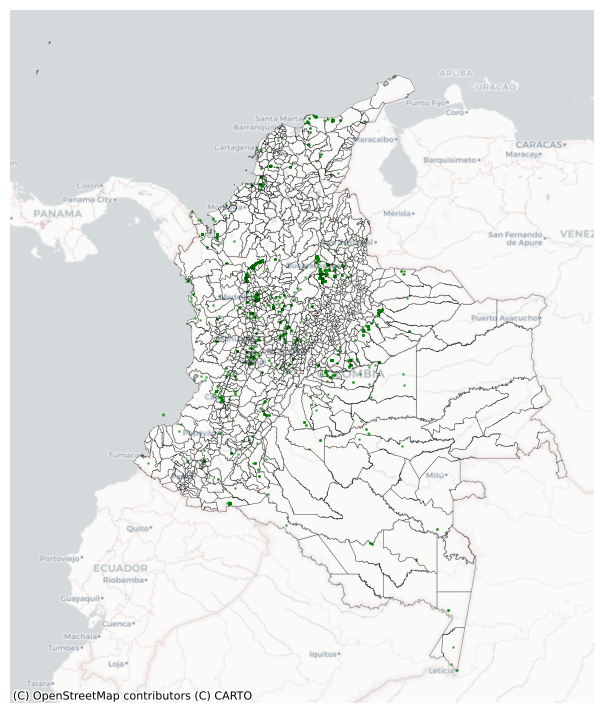

In [12]:
# Plot data
ax = data_gdf.plot.scatter("longitude","latitude",s=1,c="green",alpha=0.5,figsize=(9, 9))
# Add administrative boundaries
gdf.plot(ax=ax,facecolor="none",edgecolor="black", alpha=0.5, lw=0.3)
# remove axis
ax.set_axis_off()
# Add dark basemap
ctx.add_basemap(ax,crs="EPSG:4326",source=ctx.providers.CartoDB.Positron)

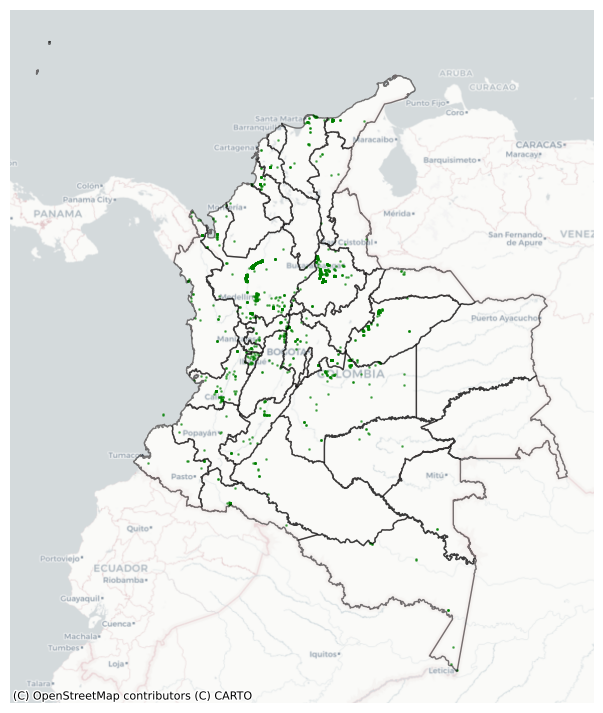

In [7]:
# Plot data
ax = data_gdf.plot.scatter("longitude","latitude",s=1,c="green",alpha=0.5,figsize=(9, 9))
# Add administrative boundaries
departamentos.plot(ax=ax,facecolor="none",edgecolor="black", alpha=0.5)
# remove axis
ax.set_axis_off()
# Add dark basemap
ctx.add_basemap(ax,crs="EPSG:4326",source=ctx.providers.CartoDB.Positron)

In [ ]:
departamentos.columns
data_gdf.columns

# Crear conteo de registros por departamento
data_by_departamento = data_gdf.groupby("departamento").size()

In [41]:
# Unir el conteo a la tabla de departamentos (ajusta el nombre de la columna clave si es necesario)
departamentos = departamentos.join(
    pd.DataFrame({"data_count": data_by_departamento}),
    on="NOMBRE_DPT"
)

In [43]:
data_gdf['departamento'].value_counts()

departamento
ANTIOQUIA             6640
SANTANDER              884
CUNDINAMARCA           127
CASANARE               108
VALLE DEL CAUCA        105
META                    84
PUTUMAYO                55
CHOCÓ                   44
SUCRE                   43
HUILA                   33
MAGDALENA               33
BOLÍVAR                 32
CALDAS                  29
LA GUAJIRA              29
TOLIMA                  26
QUINDIO                 22
CAQUETÁ                 15
AMAZONAS                10
RISARALDA                9
NARIÑO                   9
CESAR                    7
GUAVIARE                 6
CAUCA                    6
BOYACÁ                   6
CÓRDOBA                  5
ARAUCA                   5
NORTE DE SANTANDER       3
VAUPES                   2
ATLANTICO                1
Name: count, dtype: int64

Conteo de puntos por departamento

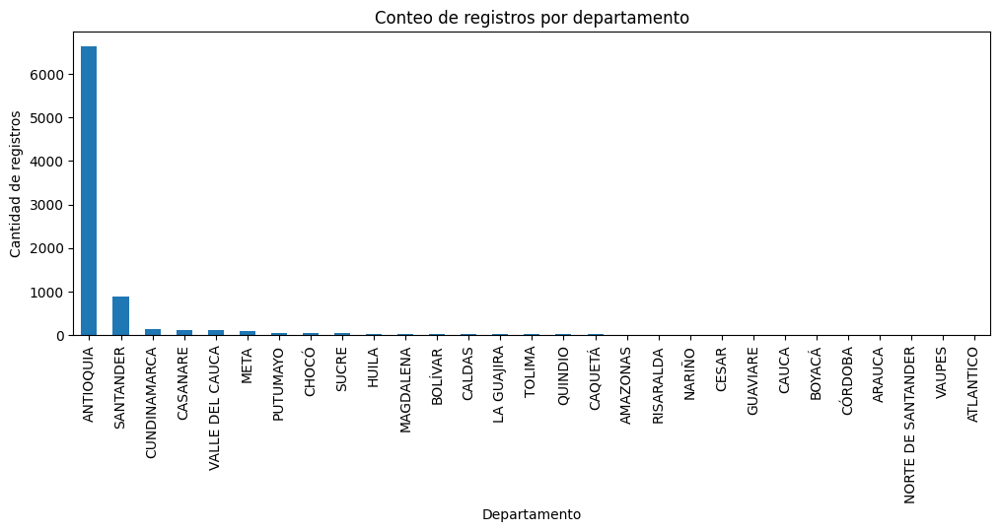

In [45]:
data_gdf['departamento'].value_counts().plot(kind='bar', figsize=(12,4))
plt.title('Conteo de registros por departamento')
plt.xlabel('Departamento')
plt.ylabel('Cantidad de registros')
plt.show()

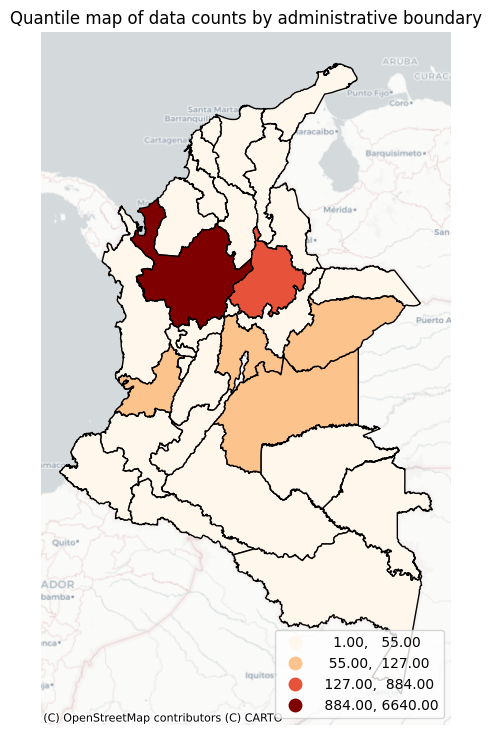

In [46]:
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot the equal interval choropleth and add a legend
departamentos.plot(column='data_count',
           scheme='natural_breaks', 
           ax=ax,
           legend=True,
           cmap='OrRd', edgecolor='k',
           k=4,
           legend_kwds={"loc": 4}
          )
# Remove the axes
ax.set_axis_off()
# Set the title
ax.set_title("Quantile map of data counts by administrative boundary")
# Add dark basemap
ctx.add_basemap(ax,crs="EPSG:4326",source=ctx.providers.CartoDB.Positron)
# Draw map
plt.show()

## Estimación de Densidad de Kernel (KDE)

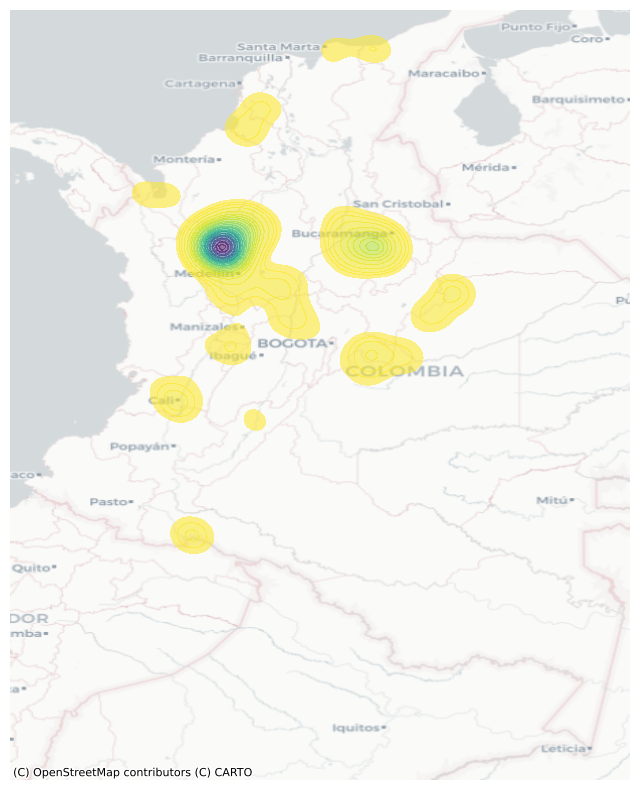

In [47]:
import contextily as ctx

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(8, 10))

# Reproyectar a Web Mercator (obligatorio para contextily)
#data_gdf = data_gdf.to_crs(epsg=3857)

# KDEplot con coordenadas reproyectadas
sbn.kdeplot(
    x=data_gdf['geometry'].x,
    y=data_gdf['geometry'].y,
    n_levels=30,
    fill=True,
    alpha=0.55,
    cmap='viridis_r',
    ax=ax
)

# Add basemap
ctx.add_basemap(ax,crs="EPSG:4326", source=ctx.providers.CartoDB.Positron)

# Remove axes
ax.set_axis_off()

# Centrografía

In [48]:
from pointpats import centrography
mean_center = centrography.mean_center(data_gdf[['longitude', 'latitude']])
med_center = centrography.euclidean_median(data_gdf[['longitude', 'latitude']])

In [49]:
print("Mean Center:", mean_center)
print("Euclidean Median Center:", med_center)

Mean Center: [-75.43338808   6.68537201]
Euclidean Median Center: [-75.84192443   6.84460605]


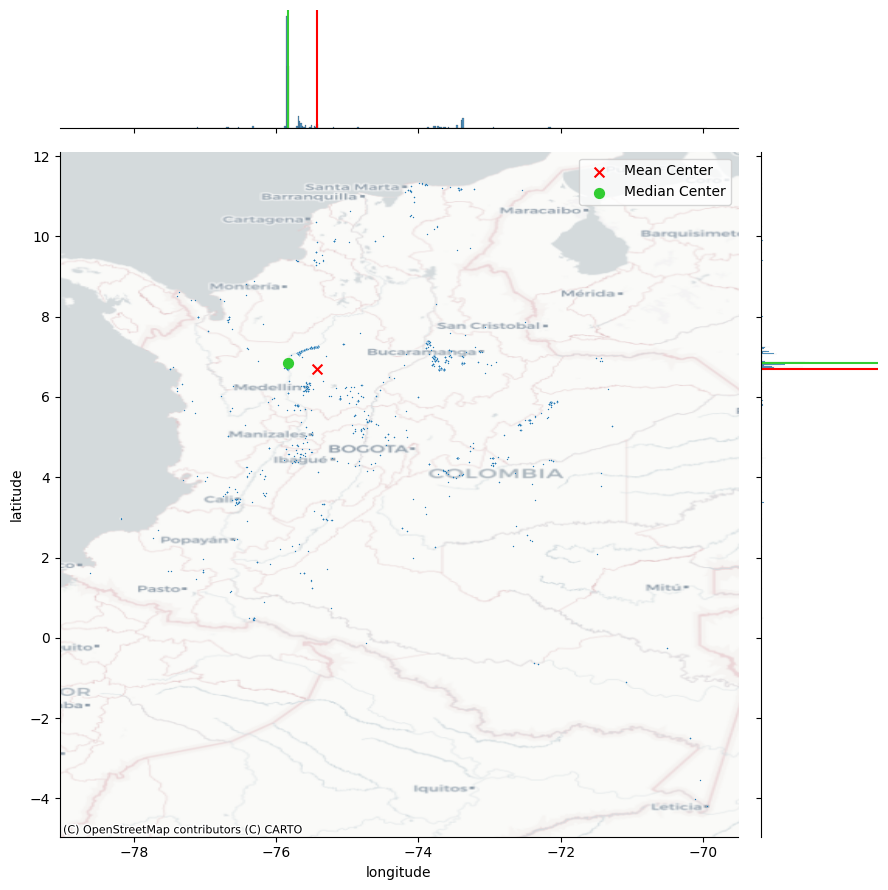

In [50]:
# Generate scatter plot
joint_axes = sbn.jointplot(x='longitude', y='latitude',data=data_gdf,s=1,height=9)
# Add mean point and marginal lines
joint_axes.ax_joint.scatter(*mean_center, color='red', marker='x', s=50, label='Mean Center')
joint_axes.ax_marg_x.axvline(mean_center[0], color='red')
joint_axes.ax_marg_y.axhline(mean_center[1], color='red')
# Add median point and marginal lines
joint_axes.ax_joint.scatter(*med_center, color='limegreen', marker='o', s=50, label='Median Center')
joint_axes.ax_marg_x.axvline(med_center[0], color='limegreen')
joint_axes.ax_marg_y.axhline(med_center[1], color='limegreen')
# Legend
joint_axes.ax_joint.legend()
# Add basemap
ctx.add_basemap(joint_axes.ax_joint,crs="EPSG:4326",source=ctx.providers.CartoDB.Positron)
# Clean axes
#joint_axes.ax_joint.set_axis_off()
# Display
plt.show()

# Dispersión:
Una medida de dispersión que es común en la centrografía es la distancia estándar. Esta medida proporciona la distancia promedio desde el centro de la nube de puntos (centro de masa)

In [51]:
# Reproyecta a un CRS en metros (Web Mercator)
data_gdf_m = data_gdf.to_crs(epsg=3857)

# Calcula la distancia estándar en metros
from pointpats import centrography
import numpy as np

coords = np.column_stack([data_gdf_m.geometry.x, data_gdf_m.geometry.y])
std_dist_m = centrography.std_distance(coords)
print(f"Distancia estándar: {std_dist_m:.2f} metros")

# Si la quieres en kilómetros:
std_dist_km = std_dist_m / 1000
print(f"Distancia estándar: {std_dist_km:.2f} km")

Distancia estándar: 158706.96 metros
Distancia estándar: 158.71 km


In [52]:
major, minor, rotation = centrography.ellipse(data_gdf[['longitude','latitude']])

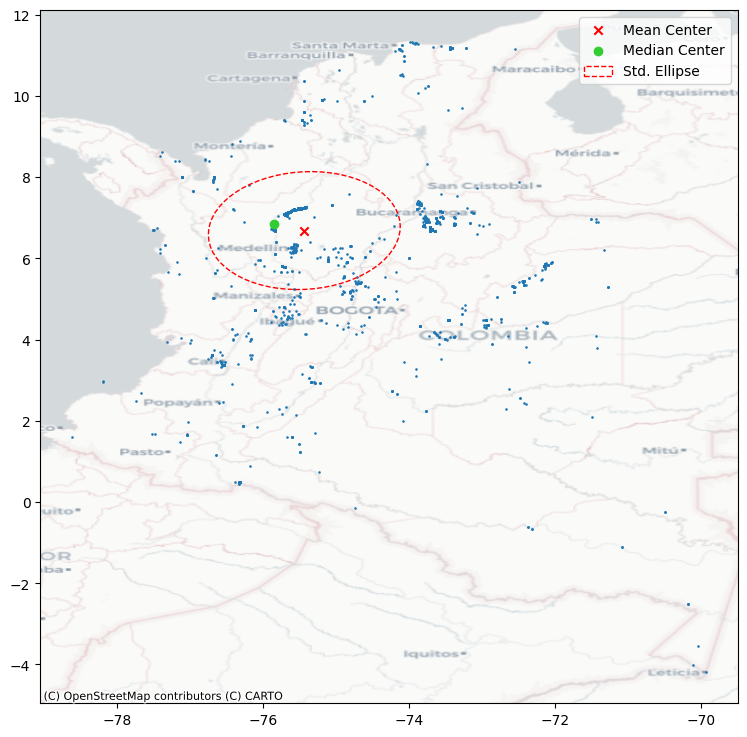

In [53]:
from matplotlib.patches import Ellipse
import numpy as np

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Plot photograph points
ax.scatter(data_gdf['longitude'], data_gdf['latitude'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                  width=major*2, # centrography.ellipse only gives half the axis
                  height=minor*2, 
                  angle = np.rad2deg(rotation), # Angles for this are in degrees, not radians
                  facecolor='none', 
                  edgecolor='red', linestyle='--',
                  label='Std. Ellipse')
ax.add_patch(ellipse)

ax.legend()
# Display
# Add basemap
ctx.add_basemap(
    ax, crs="EPSG:4326",
    source=ctx.providers.CartoDB.Positron
)
plt.show()

# Extensión:
1. Envolvente convexo (convex hull). es la forma convexa más ajustada que encierra las observaciones. Por convexa, nos referimos a que la forma nunca “retrocede” sobre sí misma; no tiene depresiones, valles, crestas o agujeros. Todos sus ángulos interiores son menores de 180 grados. Esto se calcula usando el método centrography.hull

2. Forma alpha (alpha shape), que puede entenderse como una versión más “ajustada” del envolvente convexo. Una forma de pensar en el envolvente convexo es que es el espacio que queda cuando se rueda una bola o círculo realmente grande alrededor de la forma.

In [54]:
from pointpats import distance_statistics, QStatistic, random, PointPattern
import numpy as np

# Crear arreglo de coordenadas (lon, lat)
coordinates = data_gdf[['longitude', 'latitude']].to_numpy()

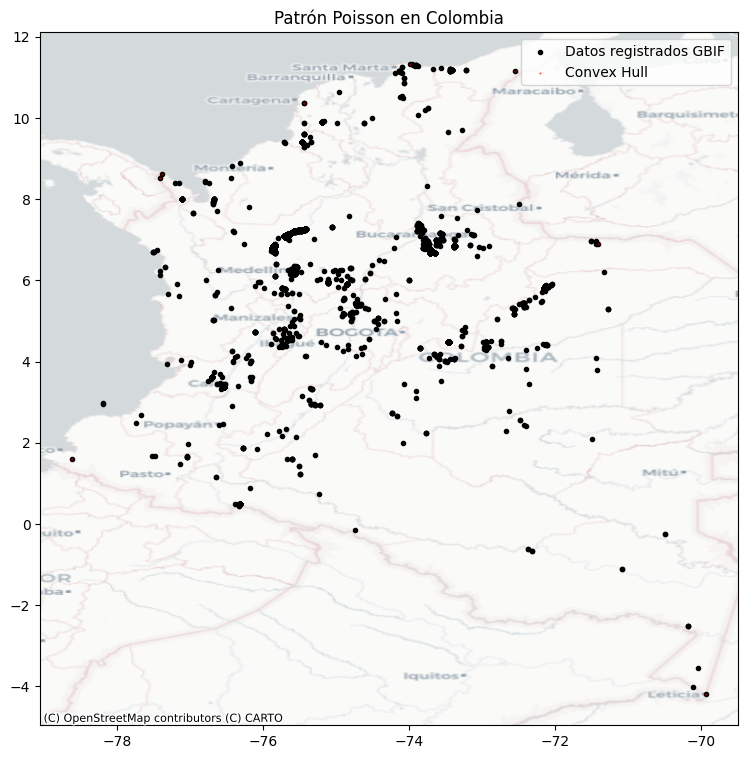

In [ ]:
#envolvente convexo (convex hull). 
convex_hull_vertices = centrography.hull(coordinates)
convex_hull_vertices

C:\Users\Valentina Cardona\AppData\Local\Temp\ipykernel_14128\2070375656.py:3: UserWarning: Numba not imported, so alpha shape construction may be slower than expected.
  alpha_shape, alpha, circs = libpysal.cg.alpha_shape_auto(coordinates, return_circles=True)


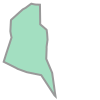

In [72]:
#Forma alpha (alpha shape)
import libpysal
alpha_shape, alpha, circs = libpysal.cg.alpha_shape_auto(coordinates, return_circles=True)
alpha_shape

# Aleatoriedad y Agrupamiento.
Con esto nos referimos a si los puntos tienden a agruparse entre sí o a dispersarse uniformemente por el área de estudio.

### 1. Proceso de puntos de Poisson.
La ubicación y el número de puntos es totalmente aleatorio; no hay ni agrupamiento ni dispersión. 

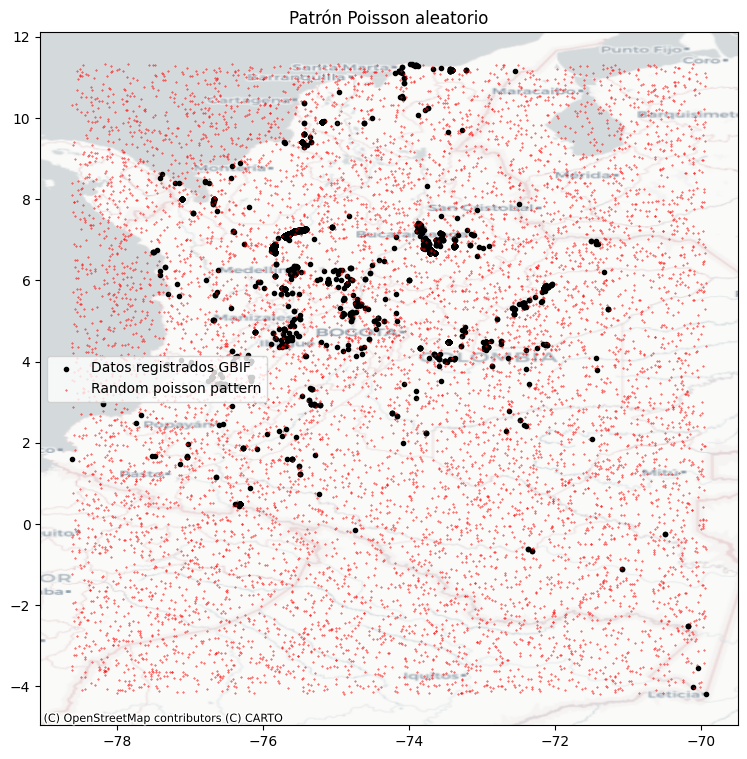

In [96]:
from pointpats import distance_statistics, QStatistic, random, PointPattern
import numpy as np

# Crear arreglo de coordenadas (lon, lat)
coordinates = data_gdf[['longitude', 'latitude']].to_numpy()

random_pattern = random.poisson(coordinates, size=len(coordinates))
# la simulación (por defecto) funciona con el cuadro delimitador del patrón de puntos de entrada. 

# Graficar
fig,ax = plt.subplots(figsize=(9, 9))
plt.scatter(*coordinates.T, color='k', marker='.', label='Datos registrados GBIF')
plt.scatter(*random_pattern.T, color='r', marker='.', s=0.5, label='Random poisson pattern')	
plt.title('Patrón Poisson aleatorio')
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.CartoDB.Positron)
ax.legend(ncol=1, loc='center left')
plt.show()


In [92]:

departamentos.head(2)

,ID_ESPACIA,AREA_OFICI,NOMBRE_DPT,geometry,data_count
0,11,1605.0,BOGOTÁ,"POLYGON ((-74.06964 4.82983, -74.06946 4.82982...",NaN
1,13,26383.0,BOLÍVAR,"POLYGON ((-75.256 10.79971, -75.25547 10.79958...",32.0


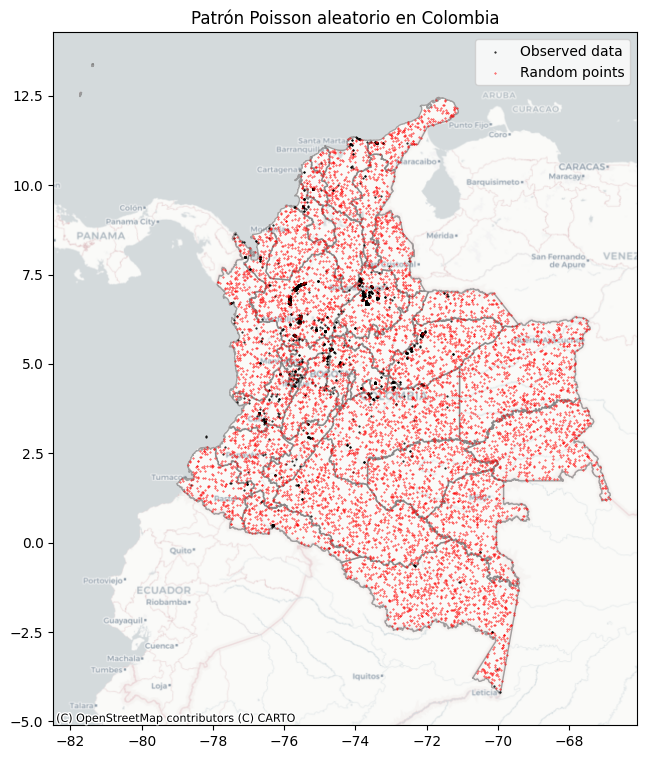

In [118]:
# Para limitar el patrón de Poisson al área de un departamento específico, debes:
from shapely.geometry import Polygon

# Generar un patron de Poisson dentro de un departamento específico
#nombre_departamento = "Antioquia"  # Cambia por el que desees
#departamento_poly = departamentos.loc[departamentos["NOMBRE_DPT"] == nombre_departamento, "geometry"].values[0]

# Generar el patrón de Poisson en todo Colombia (incluye todos los departamentos)
from shapely.ops import unary_union
# Unir todos los polígonos de los departamentos en uno solo
colombia_poly = unary_union(departamentos.geometry)
random_pattern_colombia = random.poisson(colombia_poly, size=len(coordinates))

# Graficar
fig, ax = plt.subplots(figsize=(9, 9))
departamentos.plot(ax=ax, facecolor='none', edgecolor='gray', linewidth=1, alpha=0.7)
#plt.scatter(coordinates[:,0], coordinates[:,1], color='black', marker='.', label='Datos registrados GBIF')
#plt.scatter(random_pattern_colombia[:, 0], random_pattern_colombia[:, 1], color='red', s=0.5, label='Poisson en Colombia')
plt.scatter(*coordinates.T, color='k', marker='.', label='Observed data', s=1)
plt.scatter(*random_pattern_colombia.T, color='r', marker='.', label='Random points', s=0.5)
plt.title('Patrón Poisson aleatorio en Colombia')
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.CartoDB.Positron)
plt.legend()
plt.show()


Generamos un patrón aleatorio dentro de la forma alfa:

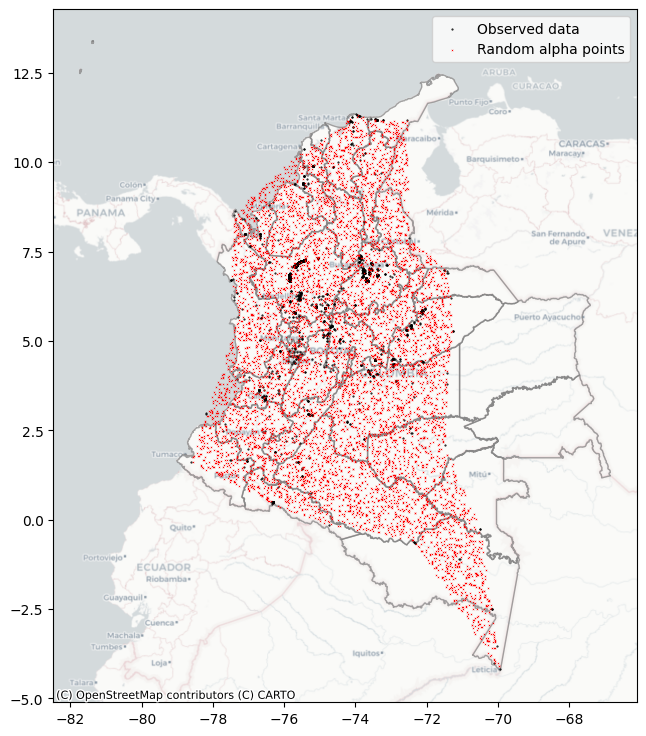

In [125]:
#Generamos un patrón aleatorio dentro de la forma alfa:
random_pattern_ashape = random.poisson(alpha_shape, size=len(coordinates))

# Graficar
f,ax = plt.subplots(1, figsize=(9, 9))
departamentos.plot(ax=ax, facecolor='none', edgecolor='gray', linewidth=1, alpha=0.7)
plt.scatter(*coordinates.T, color='k', marker='.', label='Observed data', s=1)
plt.scatter(*random_pattern_ashape.T, color='r', marker='x', label='Random alpha points', s=0.05)
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.CartoDB.Positron)
ax.legend()
plt.show()

# Alfabeto de funciones de Ripley
Estadísticas espaciales que consideramos se centra en las distribuciones de dos cantidades en un patrón de puntos: las distancias al vecino más cercano y lo que denominamos “gaps” en el patrón. Estas derivan del trabajo seminal de Ripley (1991) sobre cómo caracterizar el agrupamiento o la co-ubicación en patrones de puntos. 

## 1. Ripley's G(d) function

La primera función (G), de Ripley, se enfoca en la distribución de las distancias al vecino más cercano. Es decir, la función resume las distancias entre cada punto en el patrón y su vecino más cercano. La función (G) 
analiza la distancia entre los puntos en el patrón, ayudando a identificar agrupamiento o dispersión espacial.

*Support:
Es el máximo valor de distancia (radio) hasta donde se calculará la función G.
La unidad es la misma que tus coordenadas (grados si usas, EPSG:4326 metros si reproyectas a EPSG:3857). En nuestro caso, el sistema de coordenadas es EPSG:4326. Usamos support en grados.


In [41]:
# Reproyectar a Web Mercator (metros)
data_gdf_m = data_gdf.to_crs(epsg=3857)

# Crear arreglo de coordenadas en metros
coords_m = np.column_stack([data_gdf_m.geometry.x, data_gdf_m.geometry.y])

# Calcular la distancia máxima en metros
from scipy.spatial.distance import pdist
max_dist_m = pdist(coords_m).max()
# Aproximamos a entero por debajo para facilitar la lectura
max_dist_m = int(np.floor(max_dist_m))
print(f"Distancia máxima entre puntos: {max_dist_m/1000:.2f} km")

Distancia máxima entre puntos: 1793.44 km


In [ ]:
# Tomar una muestra aleatoria (opcional, para acelerar el cálculo)
np.random.seed(42)
sample_size = int(0.5 * len(coords_m))
sample_indices = np.random.choice(len(coords_m), size=sample_size, replace=False)
coords_sample_m = coords_m[sample_indices]

# Calcular la función G de Ripley en metros (usa un soporte <= max_dist_m)
from pointpats import distance_statistics
g_test = distance_statistics.g_test(coords_sample_m, 
                                      support=max_dist_m, 
                                      keep_simulations=True,
                                      n_simulations=99)

C:\Users\Valentina Cardona\AppData\Local\Temp\ipykernel_16804\514867098.py:27: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  f.tight_layout()
c:\Users\Valentina Cardona\anaconda3\envs\GeoAnalysis\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


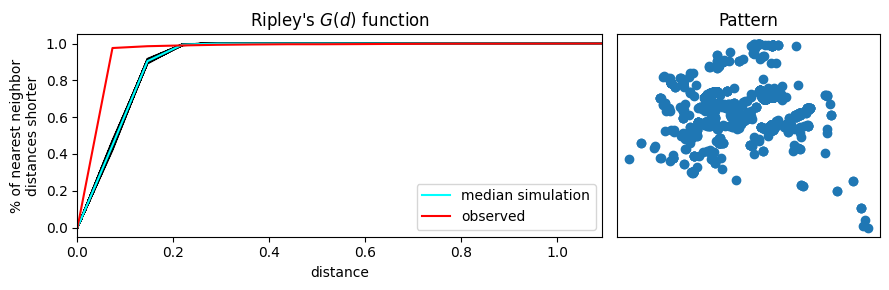

In [46]:
f,ax = plt.subplots(1,2,figsize=(9,3),gridspec_kw=dict(width_ratios=(6,3)))
# plot all the simulations with very fine lines
ax[0].plot(g_test.support, g_test.simulations.T, color='k', alpha=.01)
# and show the average of simulations
ax[0].plot(g_test.support, np.median(g_test.simulations, axis=0), color='cyan',label='median simulation')


# and the observed pattern's G function
ax[0].plot(g_test.support, g_test.statistic, label = 'observed', color='red')

# clean up labels and axes
ax[0].set_xlabel('distance')
ax[0].set_ylabel('% of nearest neighbor\ndistances shorter')
ax[0].legend()
ax[0].set_xlim(0, g_test.support.max())  # <-- Ajuste aquí
ax[0].set_title(r"Ripley's $G(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title('Pattern')
f.tight_layout()
plt.show()

## 2. Ripley's F(d) function

La función F trabaja analizando la distancia hacia los puntos en el patrón desde ubicaciones en el espacio vacío. Caracteriza la distancia típica desde puntos arbitrarios en el espacio vacío hasta el patrón de puntos. Si el patrón tiene grandes huecos o áreas vacías, la función aumentará lentamente. Pero, si el patrón está muy disperso, la función aumentará rápidamente. La forma de esta distribución acumulada luego se compara con aquellas construidas calculando la misma distribución acumulada entre el patrón aleatorio y otro patrón aleatorio adicional generado en cada paso de la simulación.

In [48]:
# Calcular la función F de Ripley en la muestra
f_test = distance_statistics.f_test(coords_sample_m, 
                                      support=max_dist_m, 
                                      keep_simulations=True,
                                      n_simulations=99)

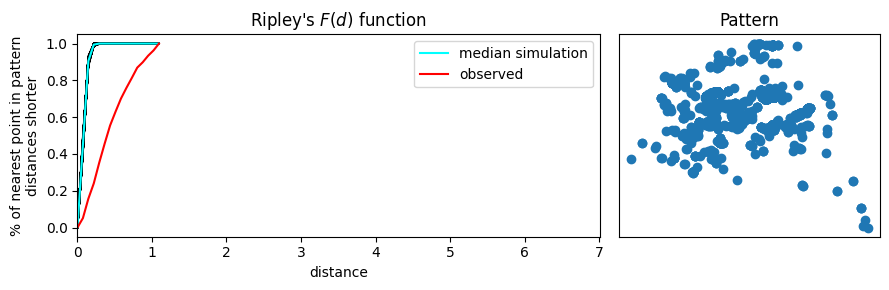

In [150]:
f,ax = plt.subplots(1,2,figsize=(9,3), gridspec_kw=dict(width_ratios=(6,3)))

# plot all the simulations with very fine lines
ax[0].plot(f_test.support, f_test.simulations.T, color='k', alpha=.01)
# and show the average of simulations
ax[0].plot(f_test.support, np.median(f_test.simulations, axis=0), color='cyan',label='median simulation')


# and the observed pattern's F function
ax[0].plot(f_test.support, f_test.statistic, label = 'observed', color='red')

# clean up labels and axes
ax[0].set_xlabel('distance')
ax[0].set_ylabel('% of nearest point in pattern\ndistances shorter')
ax[0].legend()
ax[0].set_xlim(0, g_test.support.max())  # <-- Ajuste aquí
ax[0].set_title(r"Ripley's $F(d)$ function")

# plot the pattern itself on the next frame
ax[1].scatter(*coordinates.T)

# and clean up labels and axes there, too
ax[1].set_xticks([])
ax[1].set_yticks([])
ax[1].set_xticklabels([])
ax[1].set_yticklabels([])
ax[1].set_title('Pattern')
f.tight_layout()
plt.show()

# Identificación de agrupamientos (Clusters)

## 1. Agrupamiento DBSCAN 
Algoritmo determinista. DBSCAN (Agrupamiento Basado en Densidad de Aplicaciones) es un método de agrupamiento basado en la densidad, lo que significa que los puntos que están estrechamente agrupados se asignan al mismo grupo y se les da el mismo ID.

Si no indicas ningún parámetro en DBSCAN(), los valores por defecto son:
* eps=0.5
* min_samples=5
* metric='euclidean'
* algorithm='auto'
* leaf_size=30
* p=2
* n_jobs=None

In [ ]:
from sklearn.cluster import DBSCAN

# Usamos el GeoDaframe reproyectado a metros (data_gdf_m). Sin embargo, 
# a pesar de estar usando el GeoDataFrame reproyectado, DBSCAN esta interpretando
# ese eps=0.5 en unidades de grados, no metros. (TENER ESO PRESENTE)
# 0.5 grados es aproximadamente 55.66 km en el ecuador, pero varía según la latitud.

# Define DBSCAN
clusterer = DBSCAN()
# Fit to our data
clusterer.fit(data_gdf_m[["longitude", "latitude"]])

import pandas as pd
lbls = pd.Series(clusterer.labels_, index=data_gdf_m.index)

Valores por defecto
* eps=0.5grados=55.66km . La distancia máxima entre puntos para ser considerados dentro del mismo grupo.
* minPts=5. El número mínimo de puntos necesarios para formar un grupo

Con los anteriores parámetros identifico 13 clústeres

In [ ]:
# Verifica cuantos clusteres identifico y si hay ruido
# Número de clusters (excluyendo el ruido, que es -1)
n_clusters = len(set(lbls)) - (1 if -1 in lbls.values else 0)
print(f"Número de clusters encontrados: {n_clusters}")

# También puedes ver cuántos puntos hay en cada cluster:
print(lbls.value_counts())

Número de clusters encontrados: 13
 1     7733
 0      268
 9       79
 2       61
 8       52
 6       48
-1       43
 4       23
 3       23
 5       22
 7        9
 11       8
 10       6
 12       5
Name: count, dtype: int64


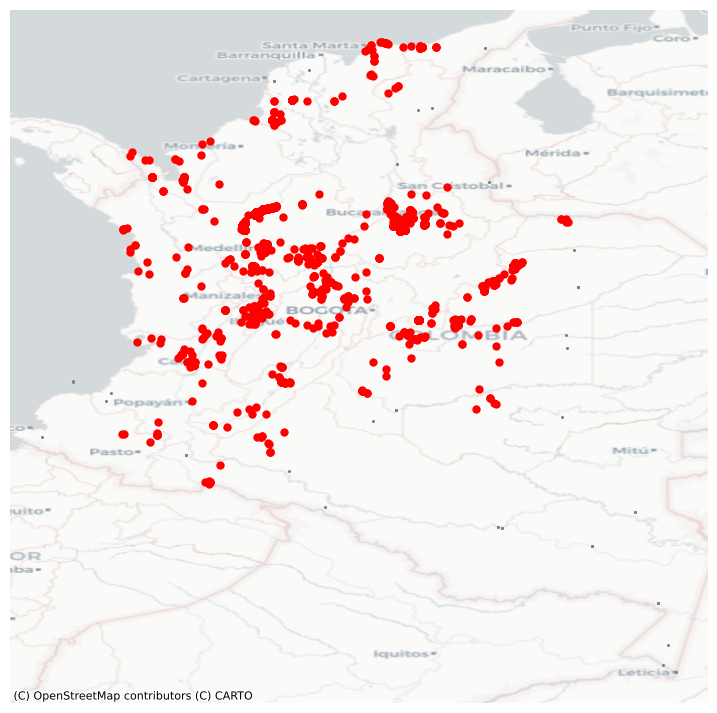

In [61]:
# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))
# Subset points that are not part of any cluster (noise)
noise = data_gdf_m.loc[lbls==-1, ['longitude', 'latitude']]
# Plot noise in grey
ax.scatter(noise['longitude'], noise['latitude'], c='grey', s=5, linewidth=0)
# Plot all points that are not noise in red
# NOTE how this is done through some fancy indexing, where
#      we take the index of all points (tw) and substract from
#      it the index of those that are noise
ax.scatter(data_gdf_m.loc[data_gdf_m.index.difference(noise.index), 'longitude'], \
           data_gdf_m.loc[data_gdf_m.index.difference(noise.index), 'latitude'], \
          c='red', linewidth=0)
# Add basemap
ctx.add_basemap(ax, crs="EPSG:4326", source=ctx.providers.CartoDB.Positron)
# Remove axes
ax.set_axis_off()
# Display the figure
plt.show()

In [67]:
# Distancia máxima entre puntos. Las unidades son metros
max_dist_m = pdist(coords_m).max()
max_dist_km = max_dist_m / 1000
print(max_dist_m, max_dist_km)

# Definir el modelo de DBSCAN con un epsilon basado en la distancia máxima

1793442.4187127408 1793.4424187127408


A pesar de haber reproyectado, DBSCAN sigue usando las coordenadas en grados. 

Planteamos una clusterización:
* poblacion minima viable (50 individuos)
* Distancia máxima para considerarse dentro de un mismo cluster (50km)

In [146]:
from sklearn.cluster import DBSCAN
import numpy as np

# Extrae coordenadas en metros
coords = np.column_stack([data_gdf_m.geometry.x, data_gdf_m.geometry.y])

# Ajusta eps en metros (50km= 50000 metros)
clusterer = DBSCAN(eps=50000, min_samples=50)
clusterer.fit(coords)

import pandas as pd
lbls = pd.Series(clusterer.labels_, index=data_gdf_m.index)

# Verifica resultados (clusteres y ruido)
n_clusters = len(set(lbls)) - (1 if -1 in lbls.values else 0)
print(f"Número de clusters encontrados: {n_clusters}")
print(lbls.value_counts())

Número de clusters encontrados: 7
 1    6683
 3     883
-1     354
 0     150
 4      98
 2      86
 5      74
 6      52
Name: count, dtype: int64


In [147]:
unique_labels = np.unique(lbls)
print(unique_labels)

[-1  0  1  2  3  4  5  6]


C:\Users\Valentina Cardona\AppData\Local\Temp\ipykernel_16804\2496133890.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', len(unique_labels))


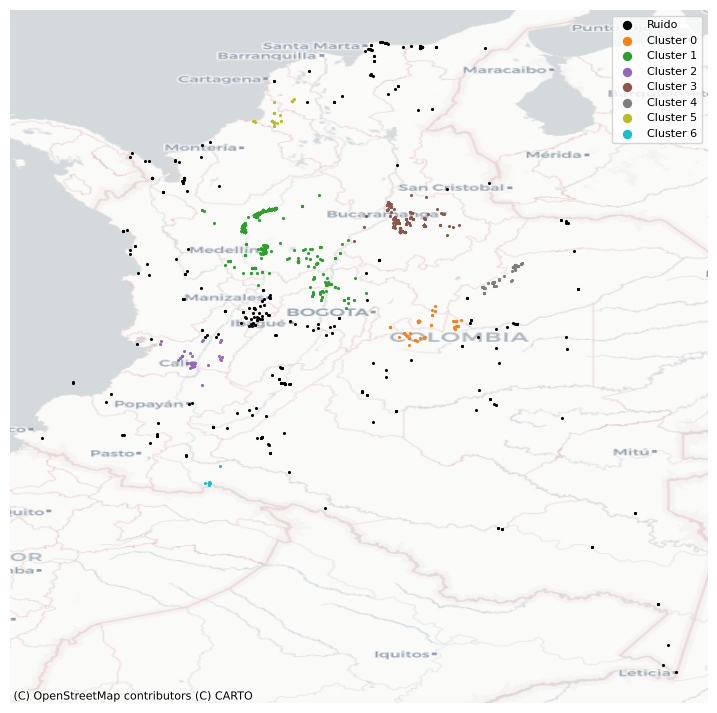

In [148]:
# Setup figure and axis
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

f, ax = plt.subplots(1, figsize=(9, 9))

# Obtén los labels únicos (clusters y ruido)
unique_labels = np.unique(lbls)

# Colores para cada cluster (ruido será gris)
colors = cm.get_cmap('tab10', len(unique_labels))

for i, label in enumerate(unique_labels):
    cluster_points = data_gdf_m[lbls == label]
    color = 'black' if label == -1 else colors(i)
    ax.scatter(cluster_points.geometry.x, cluster_points.geometry.y, 
               c=[color], s=5, linewidth=0, label=f'Cluster {label}' if label != -1 else 'Ruido')

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

# Remove axes
ax.set_axis_off()
# Add legend (opcional, puede ser largo si hay muchos clusters)
ax.legend(markerscale=3, fontsize=8, loc='best')
# Display the figure
plt.show()